In [1]:
print("Hello World!")

Hello World!


## Card Counting Detectorbot


This project is a RNN to take an input WAV file and count the number of cards from the audio.



<img src="images/sound.png" style="width:1000px;height:150px;">


Lets get started! Run the following cell to load the package you are going to use.    


In [2]:
import numpy as np
from pydub import AudioSegment
import random
import sys
import io
import os
import glob
import IPython
import pandas as pd
import pydub 
import imageio
from td_utils import *
%matplotlib inline
import matplotlib.pyplot as plt
from scipy.io import wavfile
from sklearn.model_selection import train_test_split
import os
from pydub import AudioSegment
from matplotlib.backends.backend_agg import FigureCanvasAgg as FigureCanvas
from matplotlib.figure import Figure

# 1 - Data synthesis: Creating an Audio dataset 

Let's start by building a dataset. Ideally, the training data should be as close as possible to the application you will want to run it on. In this case, you'd like to detect number of cards in working environments (library, home, offices, open-spaces ...). You thus need to create recordings with a mix of deck sizes on different background sounds. Let's see how you can create such a dataset. 


## Audio Samples

In [3]:
IPython.display.Audio("./raw_data/activates/1.wav")

In [4]:
IPython.display.Audio("./raw_data/negatives/4.wav")

In [5]:
IPython.display.Audio("./raw_data/backgrounds/1.wav")

You will use these three type of recordings (positives/negatives/backgrounds) to create a labelled dataset.

## 1.2 - From audio recordings to spectrograms

What really is an audio recording? A microphone records little variations in air pressure over time, and it is these little variations in air pressure that your ear also perceives as sound. You can think of an audio recording is a long list of numbers measuring the little air pressure changes detected by the microphone. We will use audio sampled at 44100 Hz (or 44100 Hertz). This means the microphone gives us 44100 numbers per second. Thus, a 10 second audio clip is represented by 441000 numbers (= $10 \times 44100$). 

We're going to be using spectrograms to input to the network

In [6]:
IPython.display.Audio("audio_examples/4022 Davis St 6.wav")

/Users/lukethomas/anaconda3/lib/python3.7/site-packages/matplotlib/axes/_axes.py:7609: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


(101, 1323)


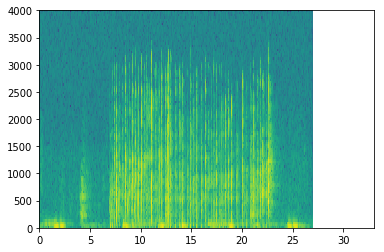

In [7]:
x = graph_spectrogram("audio_examples/4022 Davis St 6.wav")
print(x.shape)

The graph above represents how active each frequency is (y axis) over a number of time-steps (x axis). 

<img src="images/spectrogram.png" style="width:500px;height:200px;">
<center> **Figure 1**: Spectrogram of an audio recording, where the color shows the degree to which different frequencies are present (loud) in the audio at different points in time. Green squares means a certain frequency is more active or more present in the audio clip (louder); blue squares denote less active frequencies. </center>



## Dimensions
The dimension of the output spectrogram depends upon the hyperparameters of the spectrogram software and the length of the input. In this notebook, we will be working with 

5


second audio clips as the "standard length" for our training examples. The number of timesteps of the spectrogram will be 5511. You'll see later that the spectrogram will be the input $x$ into the network, and so $T_x = 5511$.

# Preprocessing Audio
<font color='red'>
#depricated
</font>



In [8]:
# Preprocess the audio to the correct format
def preprocess_audio(filename):
    # Trim or pad audio segment to 6000ms
    padding = AudioSegment.silent(duration=6000)
    segment = AudioSegment.from_wav(filename)[:6000]
    segment = padding.overlay(segment)
    # Set frame rate to 44100
    segment = segment.set_frame_rate(44100)
    # Export as wav
    segment.export(filename, format='wav')

In [6]:
your_filename = "audio_examples/4022 Davis St 6.wav"

In [7]:
IPython.display.Audio(your_filename)

In [8]:
preprocess_audio(your_filename)
IPython.display.Audio(your_filename) # listen to the audio you uploaded 

In [9]:
_, data = wavfile.read("audio_examples/4022 Davis St 6.wav")
print("Time steps in audio recording before spectrogram", data[:,0].shape)
print("Time steps in input after spectrogram", x.shape)

Time steps in audio recording before spectrogram (264600,)
Time steps in input after spectrogram (101, 1323)


Now, you can define:

In [10]:
Tx = 2699 # The number of time steps input to the model from the spectrogram
n_freq = 101 # Number of frequencies input to the model at each time step of the spectrogram

Note that even with 6 seconds being our default training example length, 6 seconds of time can be discretized to different numbers of value. You've seen 216090 (raw audio) and 2699 (spectrogram). In the former case, each step represents $6/216090 \approx 0.000023$ seconds. In the second case, each step represents $6/2699 \approx 0.0018$ seconds. 

For the 6sec of audio, the key values you will see are:

- $216090$ (raw audio)
- $2699 = T_x$ (spectrogram output, and dimension of input to the neural network). 
- $6000$ (used by the `pydub` module to synthesize audio) 
- $825 = T_y$ (the number of steps in the output of the GRU you'll build). 

Note that each of these representations correspond to exactly 6 seconds of time. It's just that they are discretizing them to different degrees. All of these are hyperparameters and can be changed (except the 441000, which is a function of the microphone). We have chosen values that are within the standard ranges uses for speech systems. 

Consider the $T_y = 825$ number above. This means that for the output of the model, we discretize the 6s into 825 time-intervals (each one of length $6/825 \approx 0.0072$s) and try to predict for each of these intervals what the total number of cards are.


In [11]:
Ty = 825 # The number of time steps in the output of our model

In [12]:
6/825

0.007272727272727273

## 1.3 - Generating a single training example

This is the first go at getting good training data.  I'm unsure how much training data i'll need.

Outline of aquiring data
- start with raw audio of card flip after card flip all within 5 second intervals all with the same deck of cards
- split raw audio into each 5s interval 
- create training set aggregating the 5s intervals of different deck sizes

The pydub package will manipulate audio. Pydub converts raw audio files into lists of Pydub data structures (it is not important to know the details here). Pydub uses 1ms as the discretization interval (1ms is 1 millisecond = 1/1000 seconds) which is why a 10sec clip is always represented using 10,000 steps. 

<font color='red' size="5">
    #load_card_flip_raw_audio is depricated
    </font>

In [13]:
def load_card_flip_raw_audio():
    card_flip = [210000]
    cf51 = []
    backgrounds = []
    
    for filename in os.listdir("./raw_data/card_flip"):
        if filename.endswith("wav"):
            raw_audio = AudioSegment.from_wav("./raw_data/card_flip/"+filename)
            
    for filename in os.listdir("./raw_data/backgrounds"):
        if filename.endswith("wav"):
            background = AudioSegment.from_wav("./raw_data/backgrounds/"+filename)
            backgrounds.append(background)
            
    #print(len(raw_audio))
    print(len(raw_audio)%5000)
    start = 0
    stop = len(raw_audio) - len(raw_audio)%5000 
    step_size = 5000
    
    print(start)
    print(stop)
    print(step_size)
    print(len(raw_audio))
    
    for i in range(start, stop, step_size): #step size of 5s (5000ms) || range in inclusive so you wont overflow
        #print(i, " , ", i+4999)
        card_flip.append( raw_audio[i : i+4999])
    print(len(card_flip))
    return card_flip, backgrounds

# load_card_flip_raw_audio_from_index

In [9]:
def load_card_flip_raw_audio_from_index(idx):
    card_flip = []
    cf51 = []
    backgrounds = []
    name = str(idx)
    name = name + ".wav"
    print(name)
    file_found = False
    for filename in os.listdir("./raw_data/card_flip"):
        if filename.endswith(name):
            raw_audio = AudioSegment.from_wav("./raw_data/card_flip/"+filename)[:210000]
            file_found = True
    if(file_found == False):
        return 0, file_found
    padding = AudioSegment.silent(duration=210000)
    raw_audio = padding.overlay(raw_audio) 
    #raw audio at this point is exactly 3:30 seconds (padded w/ silence if short)
    
    #print(len(raw_audio))
    start = 0
    stop = 210000
    step_size = 5000
    
    #print("start: "+ str(start))
    #print("stop: " + str(stop))
    #print("step_size: " + str(step_size))
    #print("len(raw_audio): " + str(len(raw_audio)))
    
    for i in range(start, stop, step_size): #step size of 5s (5000ms) || range in inclusive so you wont overflow
        #print(i, " , ", i+4999)
        card_flip.append( raw_audio[i : i+4999])
    #print("len(card_flip): " + str(len(card_flip)))
    return card_flip, file_found

In [10]:

card_flip, file_found = load_card_flip_raw_audio_from_index(55)
print(file_found)
print("len(card_flip): " + str(len(card_flip)))

55.wav
True
len(card_flip): 42


In [11]:
card_flip[41].export("training_demo.wav", format = "wav")
IPython.display.Audio("training_demo.wav")

# Labeling the data

Each audio clip name ("Flips of 51.wav) is going to contain the number of cards flipped in the audio presented.  The training Y will be assigned a single integer number either 0 (negative example) up to 55 cards.

each training input will be 5000ms



## 1.4 - Full training set

You've now implemented the code needed to generate a single training example. We'll use that method to compile the current labeled training set  

In [12]:
t = np.ones(5)
t = t*4
t = np.append(t, np.ones(3))
print(t)

[4. 4. 4. 4. 4. 1. 1. 1.]


In [13]:
def load_pydub_set():
    start_training_cflips = 30
    max_training_cflips = 56
    train_X = []
    train_y = []
    #0 example
    buffer, file_found = load_card_flip_raw_audio_from_index("00")
    if(file_found):
        train_X.extend(buffer)
        y = np.zeros(len(buffer))
        train_y = np.append(train_y, y)
    for idx in range(start_training_cflips, max_training_cflips+1, 1):
        buffer, file_found = load_card_flip_raw_audio_from_index(idx)
        if(file_found):
            train_X.extend(buffer)
            y = np.ones(len(buffer))*idx
            train_y = np.append(train_y, y)
    
    
    
    return train_X, train_y

In [14]:
pd_train_X, pd_train_y = load_pydub_set()
print("len(train_X): " + str(len(pd_train_X)))
print("len(train_y): " + str(len(pd_train_y)))
print(pd_train_y[12])

00.wav
30.wav
31.wav
32.wav
33.wav
34.wav
35.wav
36.wav
37.wav
38.wav
39.wav
40.wav
41.wav
42.wav
43.wav
44.wav
45.wav
46.wav
47.wav
48.wav
49.wav
50.wav
51.wav
52.wav
53.wav
54.wav
55.wav
56.wav
len(train_X): 588
len(train_y): 588
0.0


# Getting closer to a training set.  [cleaned] need to clean up some corners
1. 0 index [check]
2. 43 index [check]
3. (and probably integer mutiples of 43) [check]

In [20]:
testpoint = 550
pd_train_X[testpoint].export("training_demo.wav", format = "wav")
print("testpoint: " + str(testpoint))
print("train_y  : " + str(pd_train_y[testpoint]))
IPython.display.Audio("training_demo.wav")
print("len(train_X[testpoint]: )" + str(len(pd_train_X[testpoint])))

testpoint: 550
train_y  : 56.0
len(train_X[testpoint]: )4999


# Preprossessing Training Set

We'll need to take the 5 second audio clips, and create spectrogram graphs to pass as input to the model

In [21]:
# Calculate and plot spectrogram for a wav audio file
def graph_spectrogram(wav_file):
    rate, data = get_wav_info(wav_file)
    nfft = 800# Length of each window segment
    fs = 44000 # Sampling frequencies
    noverlap = 10# Overlap between windows
    nchannels = data.ndim
    if nchannels == 1:
        pxx, freqs, bins, im = plt.specgram(data, nfft, fs, noverlap = noverlap, pad_to = nfft*3)
    elif nchannels == 2:
        pxx, freqs, bins, im = plt.specgram(data[:,0], nfft, fs, noverlap = noverlap, pad_to = 1024)
    return pxx

In [22]:
# Calculate and plot spectrogram for a wav audio file
def g_s(rate, data, nfft, noverlap):
    #nfft = 600# Length of each window segment
    fs = 44000 # Sampling frequencies
    #noverlap = var2# Overlap between windows
    nchannels = data.ndim
    if nchannels == 1:
        pxx, freqs, bins, im = plt.specgram(data, nfft, fs, noverlap = noverlap, pad_to = 1024, mode = 'magnitude')
    elif nchannels == 2:
        pxx, freqs, bins, im = plt.specgram(data[:,0], nfft, fs, noverlap = noverlap, pad_to = 1024, mode = 'magnitude')
    return pxx, im

KeyboardInterrupt: 

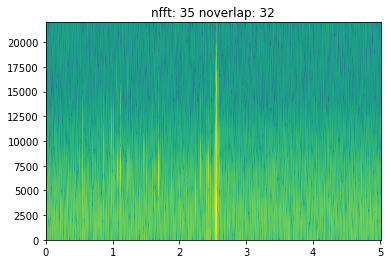

In [23]:
myList = []
fn = "audio_examples/converter.wav"
testpoint = 550
pd_train_X[testpoint].export(fn, format='wav')
rate, data = get_wav_info(fn)

for i in range(33,1024, 1):
    #for j in range(0, 10, int(i/25)):
    j = 32    
    x,img = g_s(rate, data, i,j)
    plt.title('nfft: '+ str(i) + ' noverlap: ' + str(j))
    plt.savefig('temp_img.png')
    myList.append(imageio.imread('temp_img.png'))


imageio.mimsave('temp.gif', myList,fps = 20)


![](padto1024.gif)

In [833]:
#imageio.mimsave('noverlap32.gif', myList,fps = 60)
imageio.mimsave('padto1024.gif', myList,fps = 20)

(513, 279)
56.0
testpoint: 550


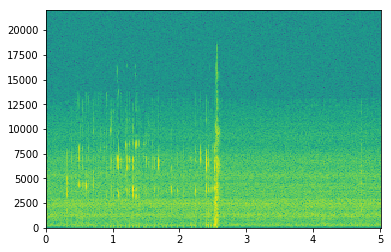

In [24]:
testpoint = np.random.randint(588)
testpoint = 550 #change the same one
fn = "audio_examples/converter.wav"
pd_train_X[testpoint].export(fn, format='wav')
x = graph_spectrogram(fn)
print(x.shape)
df = pd.DataFrame(x)
df.to_csv('testpoint_csv.csv')
print(pd_train_y[testpoint])
print("testpoint: " + str(testpoint))
IPython.display.Audio(fn)


In [25]:
def convert_pydub_set(m, tx, freq, pd_train_X, pd_train_y):

    train_X = np.zeros([m,tx, freq])
    train_y = np.zeros(m)
    #0 example
    fn = "audio_examples/converter.wav"


    for idx in range(m):
        pd_train_X[idx].export(fn, format='wav')
        x = graph_spectrogram(fn)
        train_X[idx,:,:] = x.swapaxes(0,1)
        train_y[idx] = pd_train_y[idx]
    
    return train_X, train_y

In [26]:
len(pd_train_X)

588

In [27]:
len(pd_train_X[0].get_array_of_samples())

440910

In [28]:
sam = pd_train_X[550].split_to_mono()
print(len(pd_train_X[550]))
print(len(sam[0]))
a = sam[0].get_array_of_samples()
b = pd_train_X[550].get_array_of_samples()
print(len(a))
print(len(b))

4999
4999
220455
440910


In [15]:
def convert_to_wave_set( pd_train_X, pd_train_y):
    
    m = len(pd_train_X)
    get_width = pd_train_X[0].split_to_mono()
    get_width = len(get_width[0].get_array_of_samples())
    #ex_width = len(pd_train_X[0].get_array_of_samples())
    train_X_wave = np.zeros([m, get_width, 1])
    train_y_wave = np.zeros(m)

    for idx in range(m):
        samples = pd_train_X[idx].normalize(headroom = .1)
        samples = samples.split_to_mono()
        train_X_wave[idx, :,0] = samples[0].get_array_of_samples()
        train_y_wave[idx] = pd_train_y[idx]
    
    return train_X_wave, train_y_wave

In [16]:
train_X_wave, train_y_wave = convert_to_wave_set(pd_train_X, pd_train_y)
print(train_X_wave.shape)

(588, 220455, 1)


In [22]:
a = np.zeros(6)
a[0] = 1
print(a)
print(train_y_wave)

[1. 0. 0. 0. 0. 0.]
[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0. 44. 44. 44. 44. 44. 44. 44. 44. 44. 44. 44. 44.
 44. 44. 44. 44. 44. 44. 44. 44. 44. 44. 44. 44. 44. 44. 44. 44. 44. 44.
 44. 44. 44. 44. 44. 44. 44. 44. 44. 44. 44. 44. 45. 45. 45. 45. 45. 45.
 45. 45. 45. 45. 45. 45. 45. 45. 45. 45. 45. 45. 45. 45. 45. 45. 45. 45.
 45. 45. 45. 45. 45. 45. 45. 45. 45. 45. 45. 45. 45. 45. 45. 45. 45. 45.
 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46.
 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46.
 46. 46. 46. 46. 46. 46. 47. 47. 47. 47. 47. 47. 47. 47. 47. 47. 47. 47.
 47. 47. 47. 47. 47. 47. 47. 47. 47. 47. 47. 47. 47. 47. 47. 47. 47. 47.
 47. 47. 47. 47. 47. 47. 47. 47. 47. 47. 47. 47. 48. 48. 48. 48. 48. 48.
 48. 48. 48. 48. 48. 48. 48. 48. 48. 48. 48. 48. 48. 48. 48. 48. 48. 48.
 48. 48. 48. 48. 48. 48. 48. 48

470
118
470
118


<function matplotlib.pyplot.show(*args, **kw)>

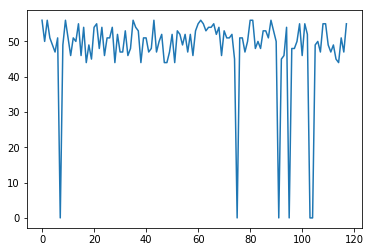

In [141]:
X_train, X_test, y_train, y_test = train_test_split(train_X_wave, train_y_wave, test_size=0.2)
print(len(X_train))
print(len(X_test))
print(len(y_train))
print(len(y_test))
plt.plot(y_test)
plt.show

In [991]:
print(len(train_X_wave))
samples = pd_train_X[testpoint].get_array_of_samples()
print(samples)

588
array('h', [0, 0, 1, 1, 2, 2, 2, 2, 2, 2, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 2, 2, 1, 1, 0, 0, -1, -1, -1, -1, 0, 0, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 2, 2, 3, 3, 1, 1, -1, -1, -2, -2, -3, -3, -3, -3, -2, -2, -1, -1, 0, 0, -1, -1, -2, -2, -2, -2, -1, -1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, -1, -1, -2, -2, -2, -2, -2, -2, -1, -1, -1, -1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, -1, -1, -1, -1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, -1, -1, -1, -1, -1, -1, 0, 0, 2, 2, 2, 2, 1, 1, 0, 0, -1, -1, -1, -1, -1, -1, -2, -2, -2, -2, -2, -2, -1, -1, 0, 0, 1, 1, 2, 2, 1, 1, 0, 0, -1, -1, 0, 0, 0, 0, 1, 1, 0, 0, -1, -1, -1, -1, -1, -1, -2, -2, -2, -2, -2, -2, -2, -2, -1, -1, -1, -1, -1, -1, -2, -2, -2, -2, -1, 

ValueError: could not broadcast input array from shape (279,513) into shape (3444,33)

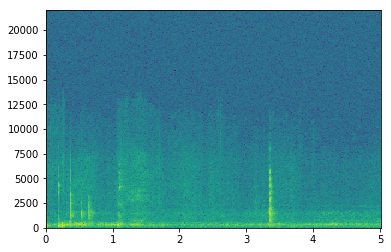

In [31]:
train_X, train_y = convert_pydub_set(588, 3444, 33, pd_train_X, pd_train_y) 

44.0


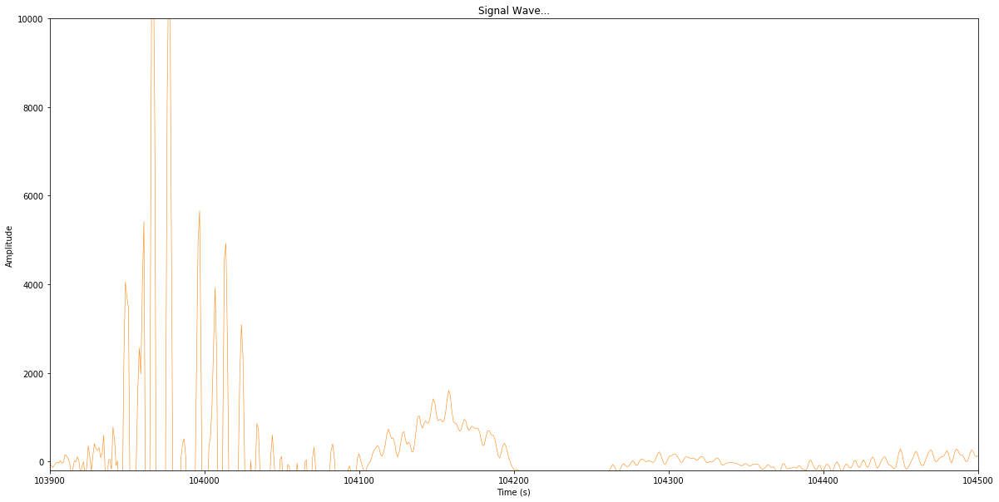

In [32]:
testpoint = 80
print(pd_train_y[testpoint])
#create a time variable in seconds
time = np.arange(0, 220455, 1) 
#samples = pd_train_X[testpoint].compress_dynamic_range( threshold=-60.0, ratio=4.0, attack=1.0, release=1.0)
samples = pd_train_X[testpoint].normalize(headroom = .1)
samples = samples.split_to_mono()
samples = samples[0].get_array_of_samples()
#plot amplitude (or loudness) over time
#plt.figure(1)
#plt.subplot(211)
plt.figure(figsize=(20,10))
plt.title('Signal Wave...')
plt.plot(time, samples, linewidth=0.6, alpha=0.9, color='#ff7f00')
axes = plt.gca()
axes.set_ylim([-200,10000])
axes.set_xlim([103900,104500])
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.show()

# 2 - Model

Now that you've built a dataset, lets write and train a trigger word detection model! 

The model will use 1-D convolutional layers, GRU layers, and dense layers. Let's load the packages that will allow you to use these layers in Keras. This might take a minute to load. 

In [124]:
from keras.callbacks import ModelCheckpoint
from keras.models import Model, load_model, Sequential
from keras.layers import Dense, Activation, Dropout, Input, Masking, TimeDistributed, LSTM, Conv1D, Multiply
from keras.layers import GRU, Bidirectional, BatchNormalization, Reshape, Permute, GlobalAveragePooling1D, MaxPooling1D
from keras.layers import Flatten, ThresholdedReLU
from keras.optimizers import Adam
from keras.utils import plot_model
from keras.backend import squeeze

import tensorflow as tf


# my current issue is with understanding some fundamentals
1. How to configure my output as a integer (and not a binary output at each timestep)
2. which loss actually makes sense
3. 

In [107]:
def evaluate_at_testpoint(testpoint, train_in):
    fn = "audio_examples/converter.wav"
    if testpoint < len(train_in):
        #pd_train_X[testpoint].export(fn, format='wav')
        #x = graph_spectrogram(fn)
        prediction = model.predict(train_in[testpoint:testpoint+1,:,:])
        return prediction

In [42]:
def evaluate_all(pd_train_X):
    #fn = "audio_examples/converter.wav"
    evaluation = np.zeros(len(pd_train_X))
    for i in range(len(pd_train_X)):
        #pd_train_X[i].export(fn, format='wav')
        #x = graph_spectrogram(fn)
        evaluation[i] = model.predict(train_X_wave[i:i+1,:,:])
        #print(evaluation[i])
    return evaluation

## 2.1 - Build the model

Here is the architecture we will use. Take some time to look over the model and see if it makes sense. 

One key step of this model is the 1D convolutional step (near the bottom of Figure 3). It inputs the 5511 step spectrogram, and outputs a 1375 step output, which is then further processed by multiple layers to get the final $T_y = 1375$ step output. This layer plays a role similar to the 2D convolutions you saw in Course 4, of extracting low-level features and then possibly generating an output of a smaller dimension. 

Computationally, the 1-D conv layer also helps speed up the model because now the GRU  has to process only 1375 timesteps rather than 5511 timesteps. The two GRU layers read the sequence of inputs from left to right, then ultimately uses a dense+sigmoid layer to make a prediction for $y^{\langle t \rangle}$. Because $y$ is binary valued (0 or 1), we use a sigmoid output at the last layer to estimate the chance of the output being 1, corresponding to the user having just said "activate."

Note that we use a uni-directional RNN rather than a bi-directional RNN. This is really important for trigger word detection, since we want to be able to detect the trigger word almost immediately after it is said. If we used a bi-directional RNN, we would have to wait for the whole 10sec of audio to be recorded before we could tell if "activate" was said in the first second of the audio clip.  


In [132]:
# GRADED FUNCTION: model

def model(input_shape):
    """
    Function creating the model's graph in Keras.
    
    Argument:
    input_shape -- shape of the model's input data (using Keras conventions)

    Returns:
    model -- Keras model instance
    """
    
    X_input = Input(shape = input_shape)
    
    #layer1
    X = Conv1D(filters = 8, kernel_size = 50, strides =25, activation = 'tanh',kernel_initializer = 'glorot_uniform',data_format='channels_last')(X_input)            # CONV2D
    #layer2
    X = BatchNormalization()(X)
    X = Conv1D(filters = 16, kernel_size = 5, strides = 5, activation = 'relu', kernel_initializer = 'glorot_uniform',data_format='channels_last')(X)
    
    X = BatchNormalization()(X)
    X = Conv1D(filters = 32, kernel_size = 3, strides = 3, activation = 'relu', kernel_initializer = 'glorot_uniform',data_format='channels_last')(X)
    
    X = BatchNormalization()(X)
    X = Conv1D(filters = 32, kernel_size = 3, strides = 3, activation = 'relu', kernel_initializer = 'glorot_uniform',data_format='channels_last')(X)
    
    X = BatchNormalization()(X)
    X = Conv1D(filters = 32, kernel_size = 3, strides = 3, activation = 'relu', kernel_initializer = 'glorot_uniform',data_format='channels_last')(X)
    
    #layer3
    X = BatchNormalization()(X)
    X = Conv1D(filters = 64, kernel_size = 10, strides = 10, activation = 'relu',kernel_initializer = 'glorot_uniform',data_format='channels_last')(X)            # CONV2D
    #layer4
    #X = BatchNormalization()(X)
    #X = Conv1D(filters = 4, kernel_size = 5, strides = 5, activation = 'sigmoid', kernel_initializer = 'glorot_uniform',data_format='channels_last')(X)
    #X = Dense(70, activation = 'sigmoid')(X)
    #X = BatchNormalization()(X)
    #X = Conv1D(filters = 2, kernel_size = 1, strides = 1, activation = 'sigmoid', kernel_initializer = 'glorot_uniform',data_format='channels_last')(X)
    
    X = ThresholdedReLU(theta = 0.999)(X)
    X = Flatten()(X)
    X = Dense(1, kernel_initializer = 'ones', activation = 'linear', trainable = False)(X) #Layer summs up the values of the Conv2d output
    model = Model(inputs = X_input, outputs = X)
    
    return model  

In [133]:
Tx = 3444
n_freq = 33
ex_width = len(train_X_wave[0])
model = model(input_shape = (ex_width, 1))

NameError: name 'Round' is not defined

Let's print the model summary to keep track of the shapes.

In [129]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_12 (InputLayer)        (None, 220455, 1)         0         
_________________________________________________________________
conv1d_50 (Conv1D)           (None, 8817, 8)           408       
_________________________________________________________________
batch_normalization_39 (Batc (None, 8817, 8)           32        
_________________________________________________________________
conv1d_51 (Conv1D)           (None, 1763, 16)          656       
_________________________________________________________________
batch_normalization_40 (Batc (None, 1763, 16)          64        
_________________________________________________________________
conv1d_52 (Conv1D)           (None, 587, 32)           1568      
_________________________________________________________________
batch_normalization_41 (Batc (None, 587, 32)           128       
__________

## 2.2 - Fit the model

In [130]:
opt = Adam(lr=0.005, beta_1=0.9, beta_2=0.999, decay=0.01)
model.compile(loss='poisson', optimizer=opt, metrics=["accuracy"])

idx is : 0
Epoch 1/5
588/588 [==============================] - 9s 16ms/step - loss: -130.5350 - acc: 0.0459
Epoch 2/5
588/588 [==============================] - 6s 10ms/step - loss: -131.9768 - acc: 0.0476
Epoch 3/5
588/588 [==============================] - 6s 10ms/step - loss: -132.9335 - acc: 0.0425
Epoch 4/5
588/588 [==============================] - 6s 10ms/step - loss: -133.7466 - acc: 0.0391
Epoch 5/5
588/588 [==============================] - 6s 10ms/step - loss: -133.9705 - acc: 0.0595


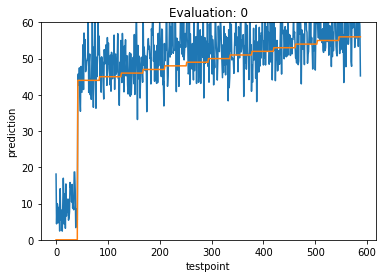

idx is : 1
Epoch 1/5
588/588 [==============================] - 5s 9ms/step - loss: -134.2819 - acc: 0.0527
Epoch 2/5
588/588 [==============================] - 5s 8ms/step - loss: -134.5572 - acc: 0.0731
Epoch 3/5
588/588 [==============================] - 5s 9ms/step - loss: -134.8017 - acc: 0.0833
Epoch 4/5
588/588 [==============================] - 5s 9ms/step - loss: -134.9473 - acc: 0.0901
Epoch 5/5
588/588 [==============================] - 6s 11ms/step - loss: -134.9682 - acc: 0.0986


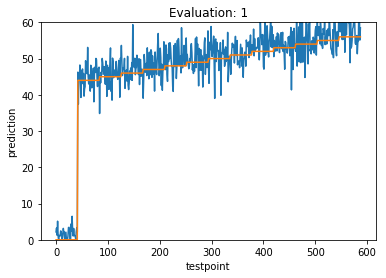

idx is : 2
Epoch 1/5
588/588 [==============================] - 7s 12ms/step - loss: -135.0463 - acc: 0.1139
Epoch 2/5
588/588 [==============================] - 6s 10ms/step - loss: -135.1204 - acc: 0.1378
Epoch 3/5
588/588 [==============================] - 6s 10ms/step - loss: -135.1276 - acc: 0.1616
Epoch 4/5
588/588 [==============================] - 5s 9ms/step - loss: -135.1590 - acc: 0.1531
Epoch 5/5
588/588 [==============================] - 5s 9ms/step - loss: -135.1676 - acc: 0.1565


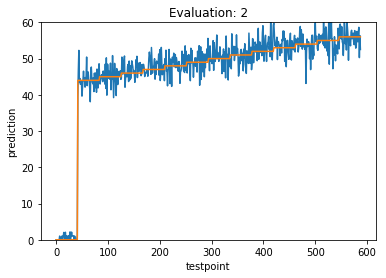

idx is : 3
Epoch 1/5
588/588 [==============================] - 5s 8ms/step - loss: -135.1790 - acc: 0.1514
Epoch 2/5
588/588 [==============================] - 5s 8ms/step - loss: -135.1928 - acc: 0.1735
Epoch 3/5
588/588 [==============================] - 5s 8ms/step - loss: -135.2070 - acc: 0.1752
Epoch 4/5
160/588 [=======>......................] - ETA: 3s - loss: -135.9718 - acc: 0.1875

KeyboardInterrupt: 

<Figure size 432x288 with 0 Axes>

In [131]:
img_list_ev = []
img_list_loss = []
loss_history = np.zeros(0)
for idx in range(300):
    print("idx is : " + str(idx))
    history = model.fit(train_X_wave, train_y_wave, batch_size = 16, epochs=5)
    evaluation = evaluate_all(train_X_wave)
    plt.plot(evaluation)
    plt.plot(train_y_wave)
    plt.title('Evaluation: ' + str(idx))
    plt.ylabel('prediction')
    plt.xlabel('testpoint')
    axes = plt.gca()
    axes.set_ylim([0,60])
    #plt.legend(['Train', 'Test'], loc='upper left')
    plt.savefig('temp_img.png')
    img_list_ev.append(imageio.imread('temp_img.png'))
    plt.show()
    plt.clf()
    
    loss_history = np.append(loss_history,history.history['loss'])
    #plt.plot(history.history['loss'])
    #plt.title('Model loss')
    #plt.ylabel('Loss')
    #plt.xlabel('Epoch')
    #axes = plt.gca()
    #axes.set_ylim([0,9])
    #plt.legend(['Train', 'Test'], loc='upper left')
    #plt.savefig('temp_img.png')
    #img_list_loss.append(imageio.imread('temp_img.png'))
    #plt.clf()
    #plt.show()

In [104]:
imageio.mimsave('training_mov11.gif', img_list_ev,fps = 45)
print(len(img_list_ev))

707


![](training_mov11.gif)

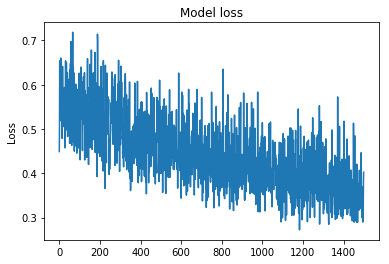

In [114]:
#
#first_save_model_loss = loss_history
plt.plot(loss_history)
plt.title('Model loss')
plt.ylabel('Loss')
plt.show()

In [530]:
#for layer in model.layers: print(layer.get_config(), layer.get_weights())
testpoint = np.random.randint(580)
prediction = evaluate_at_testpoint(testpoint, pd_train_X)
print(prediction)
print(train_y[testpoint])

[[0.]]
0.0


History:

4/23 

-2332 loss: MSE LIN X = Conv1D(196, 2, strides=1)(X_input)
-2211 loss: Conv1D(196, 2, strides=1)(X_input) 3 dense output layers 1 GRU
-2295 loss: Conv1D(196, 2, strides=1)(X_input)  #still not getting >1 output
-nan  loss: GRU(units = 128, activation = "linear" #moved to linear activation
-nan  loss: GRU(units = 128, activation = "relu" #moved to relu activation - lasted a little longer, then fail
-nan  loss: added back in conv1, fast fail
-2264 loss: Conv1D(196, 10, strides=4) added back in dropout and regularization
-i changed the activation in my 1Dconv to sigmoid, and started getting non-zero values!


# save model

In [105]:
#save model
#model.save('model_v01.h5')  # creates a HDF5 file 'my_model.h5'
#recover model
#model = load_model('my_model.h5')

In [607]:
def evaluate_all2(pd_train_X):
    #fn = "audio_examples/converter.wav"
    evaluation = np.zeros(len(pd_train_X))
    for i in range(len(pd_train_X)):
        #pd_train_X[i].export(fn, format='wav')
        #x = graph_spectrogram(fn)
        evaluation[i] = model2.predict(train_X[i:i+1,:,:])
        #print(evaluation[i])
    return evaluation

In [ ]:
 for i in range(580, len(pd_train_X)):
        print(i)

In [113]:
testpoint = 300
prediction = evaluate_at_testpoint(testpoint, train_X_wave)
print(prediction)
print(train_y_wave[testpoint])
50*.999

[[49.81429]]
50.0


49.95

## 2.3 - Test the model

Finally, let's see how your model performs on the dev set.

In [ ]:
loss, acc = model.evaluate(X_dev, Y_dev)
print("Dev set accuracy = ", acc)

This looks pretty good! However, accuracy isn't a great metric for this task, since the labels are heavily skewed to 0's, so a neural network that just outputs 0's would get slightly over 90% accuracy. We could define more useful metrics such as F1 score or Precision/Recall. But let's not bother with that here, and instead just empirically see how the model does. 

# 3 - Making Predictions

Now that you have built a working model for trigger word detection, let's use it to make predictions. This code snippet runs audio (saved in a wav file) through the network. 

<!--
can use your model to make predictions on new audio clips.

You will first need to compute the predictions for an input audio clip.

**Exercise**: Implement predict_activates(). You will need to do the following:

1. Compute the spectrogram for the audio file
2. Use `np.swap` and `np.expand_dims` to reshape your input to size (1, Tx, n_freqs)
5. Use forward propagation on your model to compute the prediction at each output step
!-->

In [ ]:
len(pd_train_X)
train_X[5:5,:,:].shape

In [ ]:
def detect_triggerword(filename):
    plt.subplot(2, 1, 1)

    x = graph_spectrogram(filename)
    # the spectogram outputs (freqs, Tx) and we want (Tx, freqs) to input into the model
    x  = x.swapaxes(0,1)
    x = np.expand_dims(x, axis=0)
    predictions = model.predict(x)
    
    
    plt.subplot(2, 1, 2)
    plt.plot(predictions[0,:,0])
    plt.ylabel('probability')
    plt.show()
    return predictions

Once you've estimated the probability of having detected the word "activate" at each output step, you can trigger a "chiming" sound to play when the probability is above a certain threshold. Further, $y^{\langle t \rangle}$ might be near 1 for many values in a row after "activate" is said, yet we want to chime only once. So we will insert a chime sound at most once every 75 output steps. This will help prevent us from inserting two chimes for a single instance of "activate". (This plays a role similar to non-max suppression from computer vision.) 

<!-- 
**Exercise**: Implement chime_on_activate(). You will need to do the following:

1. Loop over the predicted probabilities at each output step
2. When the prediction is larger than the threshold and more than 75 consecutive time steps have passed, insert a "chime" sound onto the original audio clip

Use this code to convert from the 1,375 step discretization to the 10,000 step discretization and insert a "chime" using pydub:

` audio_clip = audio_clip.overlay(chime, position = ((i / Ty) * audio.duration_seconds)*1000)
`
!--> 

In [ ]:
chime_file = "audio_examples/chime.wav"
def chime_on_activate(filename, predictions, threshold):
    audio_clip = AudioSegment.from_wav(filename)
    chime = AudioSegment.from_wav(chime_file)
    Ty = predictions.shape[1]
    # Step 1: Initialize the number of consecutive output steps to 0
    consecutive_timesteps = 0
    # Step 2: Loop over the output steps in the y
    for i in range(Ty):
        # Step 3: Increment consecutive output steps
        consecutive_timesteps += 1
        # Step 4: If prediction is higher than the threshold and more than 75 consecutive output steps have passed
        if predictions[0,i,0] > threshold and consecutive_timesteps > 75:
            # Step 5: Superpose audio and background using pydub
            audio_clip = audio_clip.overlay(chime, position = ((i / Ty) * audio_clip.duration_seconds)*1000)
            # Step 6: Reset consecutive output steps to 0
            consecutive_timesteps = 0
        
    audio_clip.export("chime_output.wav", format='wav')

## 3.3 - Test on dev examples

Let's explore how our model performs on two unseen audio clips from the development set. Lets first listen to the two dev set clips. 

In [ ]:
IPython.display.Audio("./raw_data/dev/1.wav")

In [ ]:
IPython.display.Audio("./raw_data/dev/2.wav")

Now lets run the model on these audio clips and see if it adds a chime after "activate"!

In [ ]:
filename = "./raw_data/dev/1.wav"
prediction = detect_triggerword(filename)
chime_on_activate(filename, prediction, 0.5)
IPython.display.Audio("./chime_output.wav")

In [ ]:
filename  = "./raw_data/dev/2.wav"
prediction = detect_triggerword(filename)
chime_on_activate(filename, prediction, 0.5)
IPython.display.Audio("./chime_output.wav")

# Congratulations 

You've come to the end of this assignment! 

Here's what you should remember:
- Data synthesis is an effective way to create a large training set for speech problems, specifically trigger word detection. 
- Using a spectrogram and optionally a 1D conv layer is a common pre-processing step prior to passing audio data to an RNN, GRU or LSTM.
- An end-to-end deep learning approach can be used to built a very effective trigger word detection system. 

*Congratulations* on finishing the fimal assignment! 

Thank you for sticking with us through the end and for all the hard work you've put into learning deep learning. We hope you have enjoyed the course! 


# 4 - Try your own example! (OPTIONAL/UNGRADED)

In this optional and ungraded portion of this notebook, you can try your model on your own audio clips! 

Record a 10 second audio clip of you saying the word "activate" and other random words, and upload it to the Coursera hub as `myaudio.wav`. Be sure to upload the audio as a wav file. If your audio is recorded in a different format (such as mp3) there is free software that you can find online for converting it to wav. If your audio recording is not 10 seconds, the code below will either trim or pad it as needed to make it 10 seconds. 


Once you've uploaded your audio file to Coursera, put the path to your file in the variable below.

In [ ]:
your_filename = "audio_examples/my_audio.wav"

In [ ]:
preprocess_audio(your_filename)
IPython.display.Audio(your_filename) # listen to the audio you uploaded 

Finally, use the model to predict when you say activate in the 10 second audio clip, and trigger a chime. If beeps are not being added appropriately, try to adjust the chime_threshold.

In [ ]:
chime_threshold = 0.5
prediction = detect_triggerword(your_filename)
chime_on_activate(your_filename, prediction, chime_threshold)
IPython.display.Audio("./chime_output.wav")